<a href="https://colab.research.google.com/github/neuralsrg/SupervisedLearning/blob/main/Tensorflow/%5Btutorial%5DTransferLearning%26FineTuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer Learning & Fine Tuning in Tensorflow

## Transfer Learning

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Preparing data (cat / dog classifier)

In [4]:
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'
path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True)
PATH = os.path.join(os.path.dirname(path_to_zip), 'cats_and_dogs_filtered')

train_dir = os.path.join(PATH, 'train')
validation_dir = os.path.join(PATH, 'validation')

BATCH_SIZE = 32
IMG_SIZE = (160, 160)

68616192/68606236 [==============================] - 0s 0us/step


In [6]:
train_dir, validation_dir

('/root/.keras/datasets/cats_and_dogs_filtered/train',
 '/root/.keras/datasets/cats_and_dogs_filtered/validation')

In [9]:
train_dataset = tf.keras.utils.image_dataset_from_directory(train_dir,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)
validation_dataset = tf.keras.utils.image_dataset_from_directory(validation_dir,
                                                                 shuffle=True,
                                                                 batch_size=BATCH_SIZE,
                                                                 image_size=IMG_SIZE)

Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.


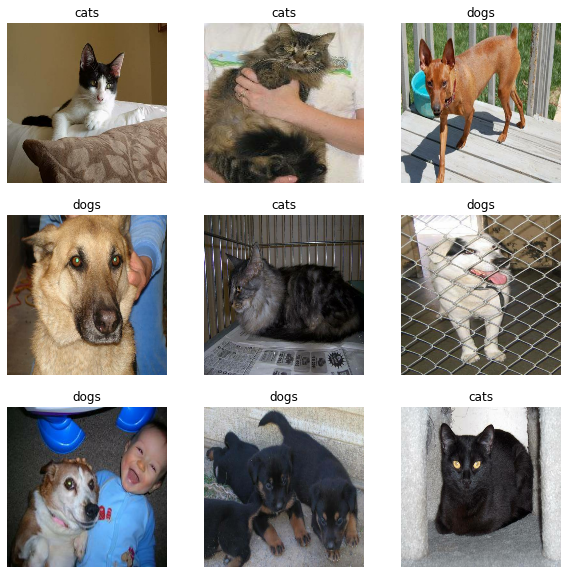

In [10]:
class_names = train_dataset.class_names

plt.figure(figsize=(10, 10))
for images, labels in train_dataset.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [11]:
# making test set

val_batches = validation_dataset.cardinality().numpy()

test_dataset = validation_dataset.take(val_batches // 5)
validation_dataset = validation_dataset.skip(val_batches // 5)

In [12]:
test_dataset.cardinality().numpy(), validation_dataset.cardinality().numpy()

(6, 26)

In [13]:
# Use buffered prefetching to load images from disk without having I/O become blocking

AUTOTUNE = tf.data.AUTOTUNE

train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

### Data augmentation

In [14]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip('horizontal'),
  tf.keras.layers.RandomRotation(0.2),
])

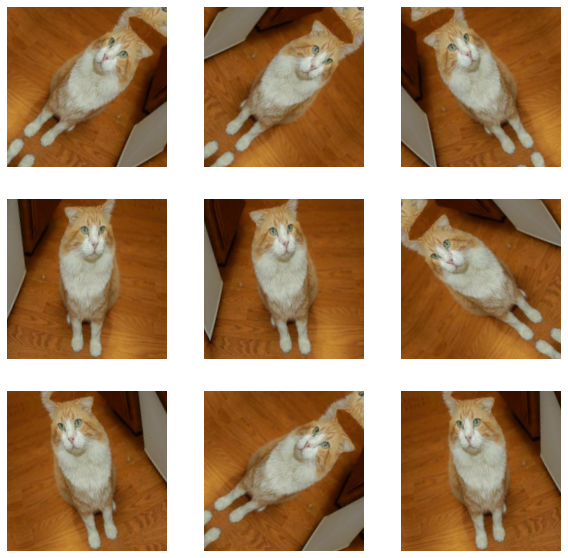

In [15]:
for image, _ in train_dataset.take(1):

  plt.figure(figsize=(10, 10))
  first_image = image[0]

  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(augmented_image[0] / 255.)
    plt.axis('off')

### Preparing data for Mobile Net input shape

In [16]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

# rescale = tf.keras.layers.Rescaling(1./127.5, offset=-1) # [0, 255] --> [-1, 1]

In [17]:
# downloading model

IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

9420800/9406464 [==============================] - 0s 0us/step


In [18]:
image_batch, label_batch = next(iter(train_dataset))
feature_batch = base_model.predict(image_batch)
print(feature_batch.shape)

(32, 5, 5, 1280)


#### Freezing base model

In [19]:
base_model.trainable = False

In [20]:
base_model.summary()

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 80, 80, 32)   864         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 80, 80, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 80, 80, 32)   0           ['bn_Conv1[0][

### Classification head

In [21]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
# (32, 5, 5, 1280) --> (32, 1280)
prediction_layer = tf.keras.layers.Dense(1)
# (32, 1280) --> (32, 1)

### Creating model

In [22]:
inputs = tf.keras.Input(shape=(160, 160, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False) # frozen weights 
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x) # we dont apply sigmoid
model = tf.keras.Model(inputs, outputs)

In [23]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              # from_logits=True since we haven't applied sigmoid
              metrics=['accuracy'])

In [24]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 160, 160, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 160, 160, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 160, 160, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                             

Only 1,281 trainable params in Dense layer (Weights (1) and bias (2))

In [25]:
len(model.trainable_variables)

2

In [26]:
initial_epochs = 10

loss0, accuracy0 = model.evaluate(validation_dataset)

26/26 [==============================] - 15s 495ms/step - loss: 0.9369 - accuracy: 0.4158


In [27]:
log_dir = "/content/drive/MyDrive/HandSigns/logs/fit/transfer_MobileNet"
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

history = model.fit(train_dataset,
                    epochs=initial_epochs,
                    validation_data=validation_dataset,
                    callbacks=[tensorboard_callback])

Epoch 1/10
63/63 [==============================] - 54s 803ms/step - loss: 0.7958 - accuracy: 0.5250 - val_loss: 0.6215 - val_accuracy: 0.6337
Epoch 2/10
63/63 [==============================] - 58s 916ms/step - loss: 0.5903 - accuracy: 0.6660 - val_loss: 0.4491 - val_accuracy: 0.7884
Epoch 3/10
63/63 [==============================] - 57s 906ms/step - loss: 0.4761 - accuracy: 0.7545 - val_loss: 0.3517 - val_accuracy: 0.8453
Epoch 4/10
63/63 [==============================] - 57s 900ms/step - loss: 0.3990 - accuracy: 0.8035 - val_loss: 0.2896 - val_accuracy: 0.8738
Epoch 5/10
63/63 [==============================] - 52s 822ms/step - loss: 0.3574 - accuracy: 0.8390 - val_loss: 0.2426 - val_accuracy: 0.9059
Epoch 6/10
63/63 [==============================] - 50s 794ms/step - loss: 0.3134 - accuracy: 0.8550 - val_loss: 0.2095 - val_accuracy: 0.9220
Epoch 7/10
63/63 [==============================] - 62s 990ms/step - loss: 0.2845 - accuracy: 0.8690 - val_loss: 0.1928 - val_accuracy: 0.9307

In [30]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/HandSigns/logs/fit

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 908), started 0:00:15 ago. (Use '!kill 908' to kill it.)

<IPython.core.display.Javascript object>

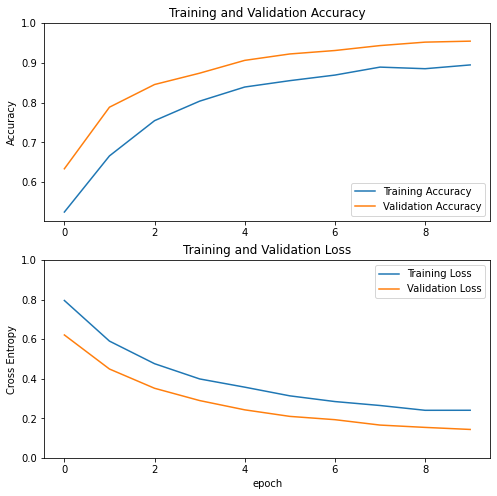

In [29]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

#### Note:
If you are wondering why the validation metrics are clearly better than the training metrics, the main factor is because layers like tf.keras.layers.BatchNormalization and tf.keras.layers.Dropout affect accuracy during training. They are turned off when calculating validation loss.

## Fine-tuning 

In the feature extraction experiment, you were only training a few layers on top of an MobileNetV2 base model. The weights of the pre-trained network were not updated during training.

One way to increase performance even further is to train (or "fine-tune") the weights of the top layers of the pre-trained model alongside the training of the classifier you added. The training process will force the weights to be tuned from generic feature maps to features associated specifically with the dataset.

#### Note:
This should only be attempted after you have trained the top-level classifier with the pre-trained model set to non-trainable. If you add a randomly initialized classifier on top of a pre-trained model and attempt to train all layers jointly, the magnitude of the gradient updates will be too large (due to the random weights from the classifier) and your pre-trained model will forget what it has learned.

Also, you should try to fine-tune a small number of top layers rather than the whole MobileNet model. In most convolutional networks, the higher up a layer is, the more specialized it is. The first few layers learn very simple and generic features that generalize to almost all types of images. As you go higher up, the features are increasingly more specific to the dataset on which the model was trained. The goal of fine-tuning is to adapt these specialized features to work with the new dataset, rather than overwrite the generic learning.

In [31]:
# unfreezing top level layers

print("Number of layers in the base model: ", len(base_model.layers))

base_model.trainable = True

# Fine-tune from this layer onwards
fine_tune_at = 100

# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
  layer.trainable = False

Number of layers in the base model:  154


As you are training a much larger model and want to readapt the pretrained weights, it is important to use a lower learning rate at this stage. Otherwise, your model could overfit very quickly.

In [32]:
model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer = tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate/10),
              metrics=['accuracy'])

In [33]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 160, 160, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 160, 160, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 160, 160, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                             

In [34]:
len(model.trainable_variables) # should be 54 old + 2 new 

56

In [35]:
fine_tune_epochs = 10
total_epochs =  initial_epochs + fine_tune_epochs

history_fine = model.fit(train_dataset,
                         epochs=total_epochs,
                         initial_epoch=history.epoch[-1], # since we continue training
                         validation_data=validation_dataset)

Epoch 10/20
63/63 [==============================] - 85s 1s/step - loss: 0.1716 - accuracy: 0.9250 - val_loss: 0.0611 - val_accuracy: 0.9777
Epoch 11/20
63/63 [==============================] - 81s 1s/step - loss: 0.1200 - accuracy: 0.9445 - val_loss: 0.0947 - val_accuracy: 0.9641
Epoch 12/20
63/63 [==============================] - 74s 1s/step - loss: 0.1095 - accuracy: 0.9525 - val_loss: 0.0439 - val_accuracy: 0.9827
Epoch 13/20
63/63 [==============================] - 75s 1s/step - loss: 0.0950 - accuracy: 0.9620 - val_loss: 0.0447 - val_accuracy: 0.9814
Epoch 14/20
63/63 [==============================] - 75s 1s/step - loss: 0.0979 - accuracy: 0.9555 - val_loss: 0.0493 - val_accuracy: 0.9814
Epoch 15/20
63/63 [==============================] - 74s 1s/step - loss: 0.0805 - accuracy: 0.9695 - val_loss: 0.0433 - val_accuracy: 0.9839
Epoch 16/20
63/63 [==============================] - 76s 1s/step - loss: 0.0776 - accuracy: 0.9695 - val_loss: 0.0467 - val_accuracy: 0.9802
Epoch 17/20
6

In [36]:
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']

loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

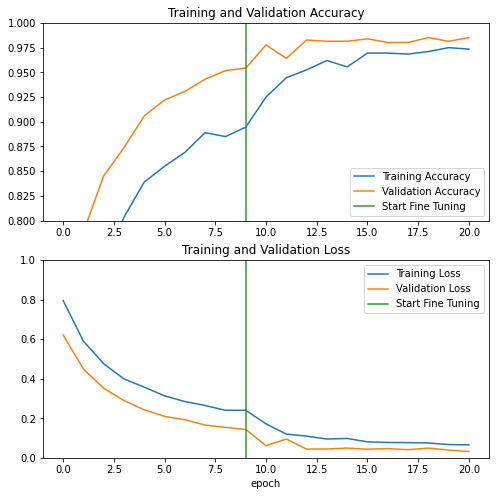

In [37]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([initial_epochs-1,initial_epochs-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([initial_epochs-1,initial_epochs-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [38]:
loss, accuracy = model.evaluate(test_dataset)
print('Test accuracy :', accuracy)

6/6 [==============================] - 4s 566ms/step - loss: 0.0426 - accuracy: 0.9792
Test accuracy : 0.9791666865348816


Predictions:
 [1 0 0 1 1 0 1 1 1 0 1 0 0 1 0 1 0 0 0 1 1 0 1 0 0 1 1 1 0 1 0 1]
Labels:
 [1 0 0 1 1 0 1 1 1 0 1 0 0 1 0 1 0 0 0 1 1 0 1 0 0 1 1 1 0 1 0 1]


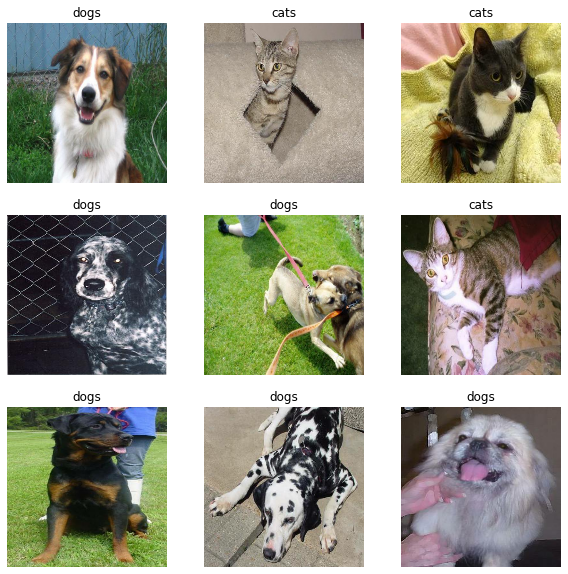

In [39]:
# Retrieve a batch of images from the test set
image_batch, label_batch = test_dataset.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch).flatten()

# Apply a sigmoid since our model returns logits
predictions = tf.nn.sigmoid(predictions)
predictions = tf.where(predictions < 0.5, 0, 1)

print('Predictions:\n', predictions.numpy())
print('Labels:\n', label_batch)

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image_batch[i].astype("uint8"))
  plt.title(class_names[predictions[i]])
  plt.axis("off")